In [1]:
!ncdump -h "/work/bb1036/b381362/dataset_icon/3d_coarse_day_ll_DOM03_ML_20130502T120000Z.nc"

netcdf \3d_coarse_day_ll_DOM03_ML_20130502T120000Z {
dimensions:
	lon = 589 ;
	lat = 637 ;
	height = 150 ;
	bnds = 2 ;
	height_2 = 151 ;
	time = UNLIMITED ; // (12 currently)
variables:
	double lon(lon) ;
		lon:standard_name = "longitude" ;
		lon:long_name = "longitude" ;
		lon:units = "degrees_east" ;
		lon:axis = "X" ;
	double lat(lat) ;
		lat:standard_name = "latitude" ;
		lat:long_name = "latitude" ;
		lat:units = "degrees_north" ;
		lat:axis = "Y" ;
	double height(height) ;
		height:standard_name = "height" ;
		height:long_name = "generalized_height" ;
		height:axis = "Z" ;
		height:bounds = "height_bnds" ;
	double height_bnds(height, bnds) ;
	double height_2(height_2) ;
		height_2:standard_name = "height" ;
		height_2:long_name = "generalized_height" ;
		height_2:axis = "Z" ;
	double time(time) ;
		time:standard_name = "time" ;
		time:units = "day as %Y%m%d.%f" ;
		time:calendar = "proleptic_gregorian" ;
		time:axis = "T" ;
	float hus(time, height, lat, lon) ;
		hus:standard_name

In [2]:
!ncdump -h "/work/bb1036/b381362/dataset_icon/2d_surface_day_DOM03_ML_20130502T120000Z.nc"

netcdf \2d_surface_day_DOM03_ML_20130502T120000Z {
dimensions:
	ncells = 22282304 ;
	vertices = 3 ;
	height = 1 ;
	height_2 = 1 ;
	depth = 8 ;
	bnds = 2 ;
	depth_2 = 9 ;
	depth_3 = 1 ;
	time = UNLIMITED ; // (60 currently)
variables:
	double height(height) ;
		height:standard_name = "height" ;
		height:long_name = "height" ;
		height:units = "m" ;
		height:positive = "up" ;
		height:axis = "Z" ;
	double height_2(height_2) ;
		height_2:standard_name = "height" ;
		height_2:long_name = "height" ;
		height_2:units = "m" ;
		height_2:positive = "up" ;
		height_2:axis = "Z" ;
	double depth(depth) ;
		depth:long_name = "depth_below_land" ;
		depth:units = "mm" ;
		depth:positive = "up" ;
		depth:axis = "Z" ;
		depth:bounds = "depth_bnds" ;
	double depth_bnds(depth, bnds) ;
	double depth_2(depth_2) ;
		depth_2:long_name = "depth_below_land" ;
		depth_2:units = "mm" ;
		depth_2:positive = "up" ;
		depth_2:axis = "Z" ;
	double depth_3(depth_3) ;
		depth_3:long_name = "depth_below_land" ;
		dept

In [1]:
#https://docs.xarray.dev/en/latest/user-guide/plotting.html
#https://xarray.pydata.org/en/v0.10.1/auto_gallery/plot_cartopy_facetgrid.html
import xarray as xr
import numpy as np
import argparse
import pprint

from mpl_toolkits.basemap import Basemap
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.colors import LinearSegmentedColormap
import numpy as np
from matplotlib.ticker import MaxNLocator

def plot_MODIS_simulation(variable, band, lat, lon, title_subplot, map_limit, fig, ax, min_colorbar, max_colorbar, type_variable):

    #axes = axes.ravel()
        if (type_variable == "refl_emis" and (band >= 1 and band <= 20 or band == 26)):
            cbar_label = 'none'
        else:
            cbar_label = 'Radiance $(W\,m^{-2}\,sr^{-1}\,\mu m^{-1})$'

        print(' ================= ploting band {} ================= '.format(band))

        map = Basemap(projection='merc',llcrnrlon=map_limit[2],llcrnrlat=map_limit[0],urcrnrlon=map_limit[3],urcrnrlat=map_limit[1],resolution='f',ax=ax) #Germany
        map.drawcoastlines()
        map.drawcountries()
        map.drawstates()
        map.drawparallels(np.arange(-90.,91.,1.),labels=[1,0,0,1],fontsize=10)
        map.drawmeridians(np.arange(-180.,181.,2.),labels=[1,0,0,1],fontsize=10)

        data = variable#(chan, lat, lon) #check it when it is nan or inf np.ma.masked_where((ds_array[variable][col]< 2000), ds_array[variable][col])                

        if(title_subplot == "RTTOV (12:30/2/5/2013)-Channel:"):
            lon,lat = np.meshgrid(lon,lat) ###funcionara sin esto revisar !!!!!!!!!!!!!!1
            print(" ================= RTTOV data min and max: ", np.min(data),np.max(data))

        x,y = map(lon,lat)  

        #pprint.pprint(data)

        #_FillValue= 999999# 0 #65535  #decide if it is needed to pass as parameter
        
        if(title_subplot == "MODIS (11:40/2/5/2013)-Channel:"):
            data = np.ma.masked_equal(data, 0) # np.ma.masked_array(data,np.isnan(data)) # data== _FillValue) mmmno necesito creo
                
            print(" ================= MODIS data min and max: ", np.min(data),np.max(data))

        #pprint.pprint(data)

        #extend = 'both' #min,max,both,neither
        cmap=plt.get_cmap('jet') #du bleu au rouge
                        
        #cs = map.contourf(x,y, y_filtered,levels,extend=extend,cmap=cmap) 

        print(' ================= PLOT colobar min and max', min_colorbar, max_colorbar)
        cs = map.pcolormesh(x,y,data, cmap=cmap,shading='auto', vmin = min_colorbar, vmax = max_colorbar)
    
        cbar = fig.colorbar(cs, ax=ax,label=cbar_label,shrink=0.75) #location="right",pad="5%",ticks=[270,275,280,285,290,295,300],
        cbar.ax.tick_params(size=0,labelsize=10)

        ax.set_title("{}{}".format(title_subplot, band),fontsize=14)
        ax.set_xlabel('Longitude', labelpad=20,fontsize=14)
        ax.set_ylabel('Latitude', labelpad=33,fontsize=14)

        


    


In [3]:
rttov_path_refl_emmis = "/home/jvillarreal/Documents/phd/github/output-rttov/rttov-131-channels-1-to-36-21042022_Reff_test.nc"
rttov_path_rad = "/home/jvillarreal/Documents/phd/github/output-rttov/rttov-131-channels-1-to-36-21042022_Reff_test.nc"
MODIS_path ="/home/jvillarreal/Documents/phd/dataset/MODIS_Germany_refl_emis_MYD021KM.A2013122.1140.061.2018046032403.nc"
path_output = "/home/jvillarreal/Documents/phd/output/with_Reff"
type_variable = "refl_emis"

map_boundaries=np.zeros(4)
map_boundaries[0] = 47.5 #llcrnrlat
map_boundaries[1] = 54.5 # 496 #urcrnrlatMODIS_variable
map_boundaries[2] = 4.5 #llcrnrlon
map_boundaries[3] = 14.5 #496 #urcrnrlon

# rttov_ds_rad = xr.open_dataset(rttov_path_rad).compute()
rttov_ds_refl_emmi = xr.open_dataset(rttov_path_refl_emmis).compute()


In [4]:
rttov_ds_refl_emmi

<xarray.Dataset>
Dimensions:          (lon: 589, lat: 637, channel: 36)
Coordinates:
  * lon              (lon) float32 4.5 4.517 4.534 4.551 ... 14.46 14.48 14.5
  * lat              (lat) float32 47.5 47.51 47.52 47.53 ... 54.47 54.49 54.5
Dimensions without coordinates: channel
Data variables:
    BRF_total        (channel, lat, lon) float32 nan nan nan nan ... 0.0 0.0 0.0
    BRF_clear        (channel, lat, lon) float32 nan nan nan nan ... 0.0 0.0 0.0
    BT_total         (channel, lat, lon) float32 0.0 0.0 0.0 ... 226.7 226.7
    BT_clear         (channel, lat, lon) float32 0.0 0.0 0.0 ... 226.7 226.7
    Radiance_total   (channel, lat, lon) float32 nan nan nan ... 48.24 48.27
    Radiance_clear   (channel, lat, lon) float32 nan nan nan ... 48.29 48.27
    Radiance_cloudy  (channel, lat, lon) float32 nan nan nan ... 48.24 48.27
    BRDF             (channel, lat, lon) float32 0.01586 0.01586 ... 0.0 0.0
    Emissivity       (channel, lat, lon) float32 0.0 0.0 0.0 ... 0.9612 0.9612
    iwp_ret          (lat, lon) float32 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    iwp_model        (lat, lon) float32 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0

In [2]:
rttov_path_refl_emmis = "/home/jvillarreal/Documents/phd/github/output-rttov/rttov-131-channels-1-to-36-21042022_Reff_test.nc"
rttov_path_rad = "/home/jvillarreal/Documents/phd/github/output-rttov/rttov-131-channels-1-to-36-21042022_Reff_test.nc"
MODIS_path ="/home/jvillarreal/Documents/phd/dataset/MODIS_Germany_refl_emis_MYD021KM.A2013122.1140.061.2018046032403.nc"
path_output = "/home/jvillarreal/Documents/phd/output/with_Reff"
type_variable = "refl_emis"

map_boundaries=np.zeros(4)
map_boundaries[0] = 47.5 #llcrnrlat
map_boundaries[1] = 54.5 # 496 #urcrnrlatMODIS_variable
map_boundaries[2] = 4.5 #llcrnrlon
map_boundaries[3] = 14.5 #496 #urcrnrlon

rttov_ds_rad = xr.open_dataset(rttov_path_rad).compute()
rttov_ds_refl_emmi = xr.open_dataset(rttov_path_refl_emmis).compute()

MODIS_ds = xr.open_dataset(MODIS_path).compute()

rttov_variable = np.zeros((np.shape(rttov_ds_rad['BRF_total'].values)))

MODIS_variable = np.zeros((3, np.shape(MODIS_ds['lat'].values)[0], np.shape(MODIS_ds['lat'].values)[1]))
# print(3, np.shape(MODIS_ds['lat'].values)[0], np.shape(MODIS_ds['lat'].values)[1])


if (type_variable == "refl_emis"):
    MODIS_variable = MODIS_ds['MODIS_Germany_refl_emis']
#         rttov_variable =rttov_ds['bt_refl_total'][:3]
    rttov_variable[:19] = rttov_ds_refl_emmi['BRF_total'][:19] #refl 1-19, 26 rad 20-25 and 27-36
    rttov_variable[19:25] = rttov_ds_rad['Radiance_total'][19:25]
    rttov_variable[25] = rttov_ds_refl_emmi['BRF_total'][25] #solo tengo en este archivo 1-19,26 luego tengo q hacer todo esto en un solo file
    rttov_variable[26:36] = rttov_ds_rad['Radiance_total'][26:36]
    print("getting_refl_emis")

elif (type_variable == "radiance"):
    MODIS_variable =MODIS_ds['MODIS_Germany_radiances']  
    rttov_variable =rttov_ds_rad['Y'] #'y' neceisto cambiar el nombre de esta variable



MODIS_bands =MODIS_ds['bands'].values
rttov_bands = list(range(1, 37)) #np.arrayrttov_ds_rad['channel'].values  ##check it becasue i am using 2 files


MODIS_lat = MODIS_ds['lat'].values
MODIS_lon = MODIS_ds['lon'].values

rttov_lat = rttov_ds_rad['lat'].values
rttov_lon = rttov_ds_rad['lon'].values
n_imgs = len(MODIS_bands)*2 #np.size(bands)
print(n_imgs)
#ncols = 2 #
nrows = 2 #
#print(n_imgs)

#nrows = n_imgs // ncols + (n_imgs % ncols > 0) #tbn pujede ser entrada
ncols = n_imgs // nrows + (n_imgs % nrows > 0) #tbn pujede ser entrada

fig = plt.figure(figsize=(5*ncols, 5*nrows),facecolor = 'white')   
fig.subplots_adjust(wspace=0.1, hspace=0.2)

position =list(range(1,n_imgs+1)) #[1:76]
position_rttov = position[:n_imgs//2 +1] #position[::2]
position_MODIS = position[n_imgs//2:] #[1::2]


for i in range(len(MODIS_bands)): 
#for i in range(2):
    bnd=MODIS_bands[i].astype(int) # hacer que cuando sea igual al indice seleccionar ese cuando la dim chan ==i
    variable = np.ma.masked_array(MODIS_variable[i],  np.isnan(MODIS_variable[i])) ## check it!!!!!!!!

    position =position_MODIS[i]

    print(bnd, position)

    variable_simulation = np.ma.masked_array(rttov_variable[bnd-1], np.isnan(rttov_variable[bnd-1])) 

    # variable_simulation = np.ma.masked_equal(variable_simulation, 0) # np.ma.masked_array(data,np.isnan(data)) # data== _FillValue)
#check it   why it is needed to doit creo q no??

    min_colorbar = np.min([np.min(variable), np.min(variable_simulation)])
    max_colorbar = np.max([np.max(variable), np.max(variable_simulation)])
    print('============modis colobar min and max',np.min(variable[i]), np.max(variable[i]))
    print('============rttov colobar min and max', np.min(variable_simulation[bnd-1]), np.max(variable_simulation[bnd-1]))

    print('============code colobar min and max', min_colorbar, max_colorbar)



    title_subplot= "MODIS (11:40/2/5/2013)-Channel:"
    ax = plt.subplot(nrows, ncols, position)
    plot_MODIS_simulation(variable = variable, #in the below area there are missing data i cut it, 
                          band = MODIS_bands[i],   
                          lat = MODIS_lat, 
                          lon = MODIS_lon, 
                          title_subplot = title_subplot, 
                          map_limit = map_boundaries, 
                          fig = fig, 
                          ax = ax, 
                          max_colorbar = max_colorbar, 
                          min_colorbar = min_colorbar,
                          type_variable = type_variable)

    title_subplot= "RTTOV (12:30/2/5/2013)-Channel:"
    position = position_rttov[i] #position+38 
    print(position)

    print(rttov_bands[bnd-1], position)

    ax = plt.subplot(nrows, ncols, position)
    plot_MODIS_simulation(variable = variable_simulation, #in the below area there are missing data i cut it, 
                          band = rttov_bands[bnd-1], 
                          lat = rttov_lat, 
                          lon = rttov_lon, 
                          title_subplot = title_subplot, 
                          map_limit = map_boundaries, 
                          fig = fig, 
                          ax = ax, 
                          max_colorbar = max_colorbar, 
                          min_colorbar = min_colorbar,
                          type_variable = type_variable)


plt.tight_layout()
figure_name = '{}/MODIS and RTTOV output {} in all bands.png'.format(path_output, type_variable) #aca pasarr con todo path

fig.savefig(figure_name) 
plt.close()    


getting_refl_emis
76
1 39
============modis colobar min and max 0.0 0.5687876480806153
============rttov colobar min and max -- --
============code colobar min and max 0.0 1.0038647651672363
 ================= ploting band 1.0 ================= 
 ================= MODIS data min and max:  0.025645337816968095 0.8853129848721437
 ================= PLOT colobar min and max 0.0 1.0038647651672363
1
1 1
 ================= ploting band 1 ================= 
 ================= RTTOV data min and max:  0.02442866563796997 1.0038647651672363
 ================= PLOT colobar min and max 0.0 1.0038647651672363
2 40
============modis colobar min and max 0.0 0.6422914583181409
============rttov colobar min and max -- --
============code colobar min and max 0.0 1.0744402408599854
 ================= ploting band 2.0 ================= 
 ================= MODIS data min and max:  0.013632443122332916 0.731919274894608
 ================= PLOT colobar min and max 0.0 1.0744402408599854
2
2 2
 ============

In [ ]:
BRF_total_bnd = list(range(0, 19)) + list(range(25,26))
BRF_total_bnd

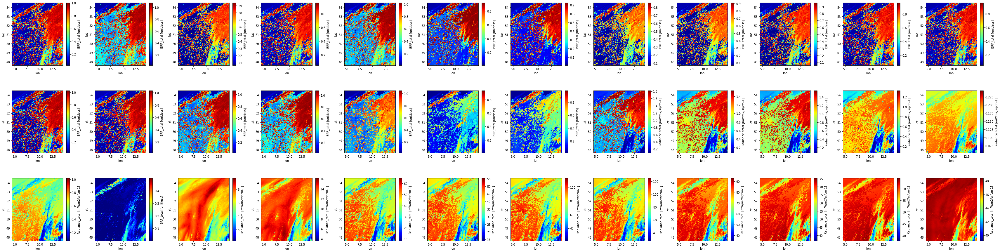

In [2]:
import xarray as xr
import numpy as np
import argparse
import pprint
import matplotlib.pyplot as plt

rttov_path_refl_emmis = "/home/jvillarreal/Documents/phd/github/output-rttov/rttov-131-channels-1-to-36-21042022_Reff_test.nc"
rttov_path_rad = "/home/jvillarreal/Documents/phd/github/output-rttov/rttov-131-channels-1-to-36-21042022_Reff_test.nc"
path_output = "/home/jvillarreal/Documents/phd/output/with_Reff"
type_variable = "refl_emis"

rttov_ds_rad = xr.open_dataset(rttov_path_rad).compute()
rttov_ds_refl_emmi = xr.open_dataset(rttov_path_refl_emmis).compute()


BRF_total_bnd = list(range(0, 19)) + list(range(25,26))
Radiance_total_bnd = list(range(19, 25)) + (list(range(26, 36)))

f, axes = plt.subplots(3,12,figsize=(60, 15), facecolor = 'white') #width of 15 inches and 7 inches in height.
f.subplots_adjust(wspace=0.3, hspace=0.4)

axli = axes.ravel()

for i in BRF_total_bnd:
    rttov_ds_refl_emmi['BRF_total'][i,9:,:].plot(cmap='jet', ax = axli[i]) #, vmin=0, vmax=0.65)
    

for i in Radiance_total_bnd:
    rttov_ds_rad['Radiance_total'][i,9:,:].plot(cmap='jet', ax = axli[i]) #, vmin=0, vmax=0.65)

output = "/home/jvillarreal/Documents/phd/output/with_Reff"
# plt.box(True)
title = 'simulations with Reff'
figure_name = '{}/{}.png'.format(output,title) #aca pasarr con todo path
# f.savefig(figure_name, dpi=600)



/home/b/b381362/output/with_Reff/simulations_with_Reff


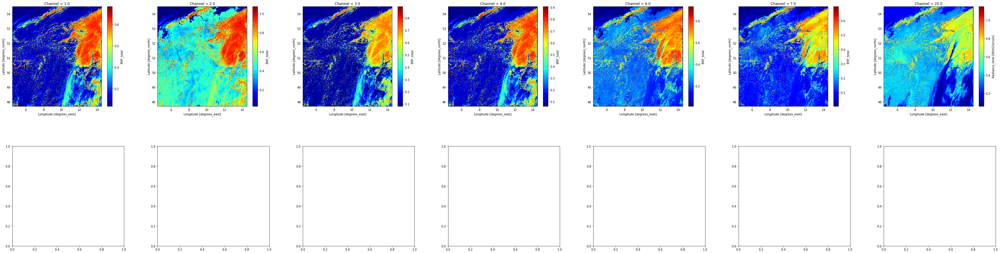

In [18]:
import xarray as xr
import numpy as np
import argparse
import pprint
import matplotlib.pyplot as plt

rttov_path_refl_emmis = "/work/bb1036/rttov_share/rttov-131-channels-1-2-3-4-6-7-20-06272022_05022013_1340pm.nc"
rttov_path_rad = rttov_path_refl_emmis #"/home/jvillarreal/Documents/phd/github/output-rttov/rttov-131-channels-1-to-36-21042022_Reff_test.nc"
path_output = "/home/b/b381362/output/with_Reff/"
type_variable = "refl_emis"

rttov_ds_rad = xr.open_dataset(rttov_path_rad).compute()
rttov_ds_refl_emmi = xr.open_dataset(rttov_path_refl_emmis).compute()


BRF_total_bnd =  list(range(0, 19)) + list(range(25,26))
Radiance_total_bnd = list(range(19, 25)) + (list(range(26, 36)))

f, axes = plt.subplots(2,7,figsize=(60, 15), facecolor = 'white') #width of 15 inches and 7 inches in height.
f.subplots_adjust(wspace=0.3, hspace=0.4)

axli = axes.ravel()

#for i in BRF_total_bnd:
for i in range(0,6):

    rttov_ds_refl_emmi['BRF_total'][i,9:,:].plot(cmap='jet', ax = axli[i]) #, vmin=0, vmax=0.65)
    

# for i in Radiance_total_bnd:
for i in range(6,7):

    rttov_ds_rad['Radiance_total'][i,9:,:].plot(cmap='jet', ax = axli[i]) #, vmin=0, vmax=0.65)

output = path_output
# plt.box(True)
title = 'simulations_with_Reff'
figure_name = '{}{}.png'.format(output,title) #aca pasarr con todo path
print(output + title)
f.savefig(figure_name, dpi=600)



In [2]:
rttov_ds_rad

<xarray.Dataset>
Dimensions:          (Longitude: 589, Latitude: 628, Channel: 7)
Coordinates:
  * Longitude        (Longitude) float32 4.5 4.517 4.534 ... 14.46 14.48 14.5
  * Latitude         (Latitude) float32 47.6 47.61 47.62 ... 54.47 54.49 54.5
  * Channel          (Channel) float32 1.0 2.0 3.0 4.0 6.0 7.0 20.0
Data variables:
    BRF_total        (Channel, Latitude, Longitude) float32 0.07597 ... 0.06353
    BRF_clear        (Channel, Latitude, Longitude) float32 0.07597 ... 0.06353
    BT_total         (Channel, Latitude, Longitude) float32 0.0 0.0 ... 277.8
    BT_clear         (Channel, Latitude, Longitude) float32 0.0 0.0 ... 277.8
    Radiance_total   (Channel, Latitude, Longitude) float32 30.85 ... 0.1747
    Radiance_clear   (Channel, Latitude, Longitude) float32 30.85 ... 0.1747
    Radiance_cloudy  (Channel, Latitude, Longitude) float32 1.283 ... 0.2493
    BRDF             (Channel, Latitude, Longitude) float32 0.02048 ... 2.623...
    Emissivity       (Channel, Latitude, Longitude) float32 0.0 0.0 ... 0.9733
    iwp_ret          (Latitude, Longitude) float32 0.0 0.0 0.0 ... 0.0 0.0 0.0
    iwp_model        (Latitude, Longitude) float32 0.0 0.0 0.0 ... 0.0 0.0 0.0

In [3]:
f.savefig(figure_name, dpi=600)


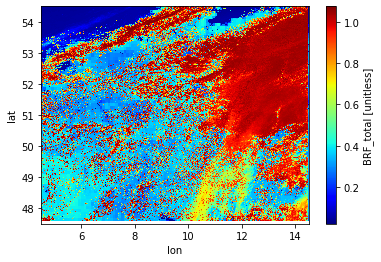

In [4]:
rttov_path_refl_emmis = "/home/jvillarreal/Documents/phd/github/output-rttov/rttov-131-channels-1-to-36-21042022_Reff_test.nc"
rttov_ds_refl_emmi = xr.open_dataset(rttov_path_refl_emmis).compute()

rttov_ds_refl_emmi['BRF_total'][1].plot(cmap='jet') #, ax = ax0) #, vmin=0, vmax=0.65)

figure_name = '{}/{}.png'.format(output,title) #aca pasarr con todo path
f.savefig(figure_name, dpi=600)



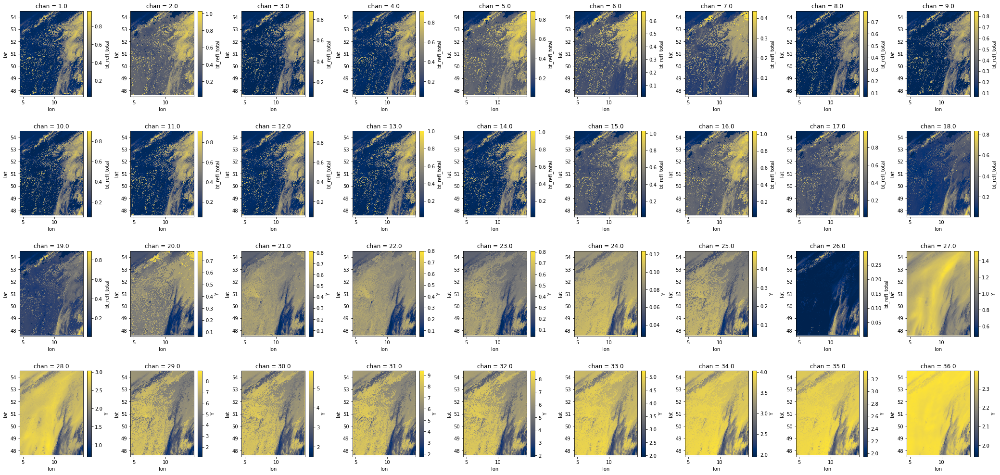

In [9]:
import xarray as xr
import numpy as np
import argparse
import pprint
import matplotlib.pyplot as plt
rttov_path_refl_emmis = "/home/b/b381362/output/output-rttov/rttov-131-data-icon-1to19-26-T12.nc"
rttov_path_rad = "/home/b/b381362/output/output-rttov/rttov-13-data-icon-1-to-36-not-flip.nc"
# /home/jvillarreal/Documents/phd/github
# path_output = "/home/jvillarreal/Documents/phd/output/"

type_variable = "refl_emis"

rttov_ds_rad = xr.open_dataset(rttov_path_rad).compute()
rttov_ds_refl_emmi = xr.open_dataset(rttov_path_refl_emmis).compute()

# rttov_variable = np.zeros((np.shape(rttov_ds_rad['Y'].values)))

    
# rttov_variable[:19] = rttov_ds_refl_emmi['bt_refl_total'][:19] #refl 1-19, 26 rad 20-25 and 27-36
# rttov_variable[19:25] = rttov_ds_rad['Y'][19:25]
# rttov_variable[25] = rttov_ds_refl_emmi['bt_refl_total'][19] #solo tengo en este archivo 1-19,26 luego tengo q hacer todo esto en un solo file
# rttov_variable[26:36] = rttov_ds_rad['Y'][26:36]

        
# f, axes = plt.subplots(3,12,figsize=(60, 15), facecolor = 'white') #width of 15 inches and 7 inches in height.
f, axes = plt.subplots(4,9,figsize=(4*9, 4*4*1.066)) #width of 15 inches and 7 inches in height.
f.subplots_adjust(wspace=0.4, hspace=0.4)

# f.subplots_adjust(wspace=0.23, hspace=0.23)

axli = axes.ravel()

for i in range(0,19):
    rttov_ds_refl_emmi['bt_refl_total'][i].plot(cmap='cividis',ax = axli[i]) #, vmin=0, vmax=0.65)
    

for i in range(19,25):
    rttov_ds_rad['Y'][i].plot(cmap='cividis',ax = axli[i]) #, vmin=0, vmax=0.65)
    
rttov_ds_refl_emmi['bt_refl_total'][19].plot(cmap='cividis',ax = axli[25]) 


for i in range(26,36):
    rttov_ds_rad['Y'][i].plot(cmap='cividis', ax = axli[i]) #, vmin=0, vmax=0.65)

# output = "/home/jvillarreal/Documents/phd/output"
output = "/home/b/b381362/output/"

# plt.box(True)
title = 'simulations refl emiss'
figure_name = '{}{}.png'.format(output,title) #aca pasarr con todo path
f.savefig(figure_name, dpi=60)
# plt.close()


In [ ]:
from sklearn import preprocessing
import numpy as np

rttov_variable[:19] = rttov_ds['BRF_total'][:19] #refl 1-19, 26 rad 20-25 and 27-36
rttov_variable[19:25] = rttov_ds['Radiance_total'][19:25]
rttov_variable[25] = rttov_ds['BRF_total'][25] #solo tengo en este archivo 1-19,26 luego tengo q hacer todo esto en un solo file
rttov_variable[26:36] = rttov_ds['Radiance_total'][26:36]
    
# normalize the data attributes
normalized = preprocessing.normalize(rttov_variable)
print("Normalized Data = ", normalized)

In [ ]:
figure_name

In [8]:
plt.close()

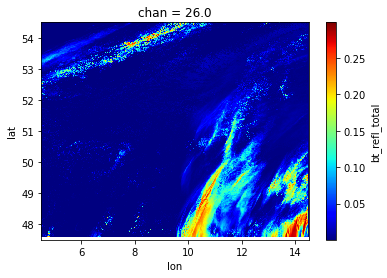

In [2]:
FILE = "/home/jvillarreal/Documents/phd/github/output-rttov/rttov-131-data-icon-1to19-26-T12.nc"
rttov_me= xr.open_dataset(FILE).compute()
BRF = rttov_me['bt_refl_total'][19]
BRF.plot(cmap='jet') #, vmin=0, vmax=1)

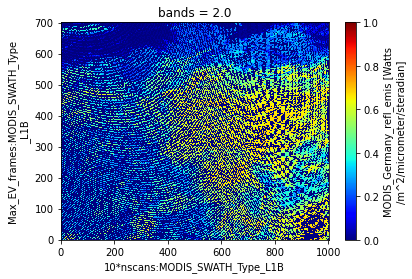

In [46]:
MODIS_path ="/home/jvillarreal/Documents/phd/dataset/MODIS_Germany_refl_emis_MYD021KM.A2013122.1140.061.2018046032403.nc"

MODIS_ds = xr.open_dataset(MODIS_path).compute()

MODIS_ds['MODIS_Germany_refl_emis'][1].transpose().plot(cmap='jet', vmin=0, vmax=1)

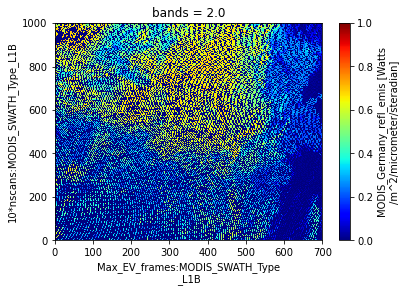

In [55]:
MODIS_ds['MODIS_Germany_refl_emis'].sel(bands =2).plot(cmap='jet', vmin=0, vmax=1)

19 0.0 0.9750000691734595
20 -0.1095561514482597 0.8715772655452838
21 0.0 0.8768138770318945
22 0.0 0.8077223300933838
23 0.0 0.1329004291200242
24 0.0 0.49777770042419434
26 0.0 1.5205776691436768
27 0.0 3.0312864780426025
28 0.0 8.897281646728516
29 0.0 5.874233245849609
30 0.0 9.363665580749512
31 0.0 8.701440010877747
32 0.0 5.227444648742676
33 0.0 4.02722692489624
34 0.0 3.377676090568471
35 0.0 2.5553777029550346


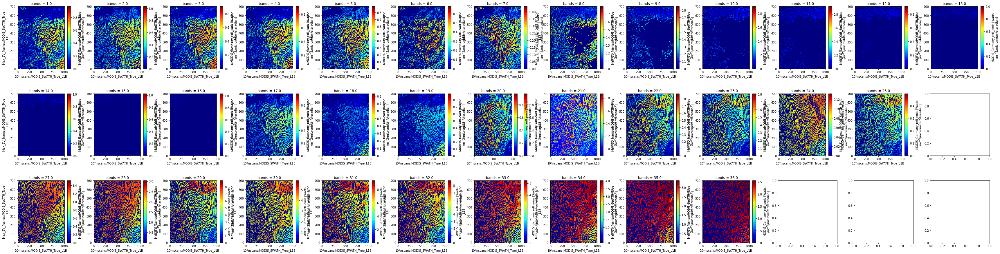

In [93]:
rttov_path_refl_emmis = '/home/jvillarreal/Documents/phd/github/output-rttov/rttov-131-data-icon-1to19-26-T12.nc'
rttov_path_rad = '/home/jvillarreal/Documents/phd/github/output-rttov/rttov-13-data-icon-1-to-36-not-flip.nc'

rttov_ds_rad = xr.open_dataset(rttov_path_rad).compute()
rttov_ds_refl_emmi = xr.open_dataset(rttov_path_refl_emmis).compute()

    
f, axes = plt.subplots(3,13,figsize=(60, 15), facecolor = 'white') #width of 15 inches and 7 inches in height.
f.subplots_adjust(wspace=0.3, hspace=0.4)

axli = axes.ravel()

BRF_total_bnd = list(range(0, 19)) + list(range(19,20))
Radiance_total_bnd = list(range(19, 25)) + (list(range(26, 36)))

for i in BRF_total_bnd:
    vmin = np.min([np.min( MODIS_ds['MODIS_Germany_refl_emis'].sel(bands=i+1)), np.min(rttov_ds_refl_emmi['bt_refl_total'][i,9:,:])])
    vmax = np.max([np.max( MODIS_ds['MODIS_Germany_refl_emis'].sel(bands=i+1)), np.max(rttov_ds_refl_emmi['bt_refl_total'][i,9:,:])])
    MODIS_ds['MODIS_Germany_refl_emis'].sel(bands=i+1).transpose().plot(cmap='jet', ax = axli[i], vmin=vmin, vmax=vmax)    
    # print(i, vmin,vmax)

for i in Radiance_total_bnd:

    vmin = np.min([np.min( MODIS_ds['MODIS_Germany_refl_emis'].sel(bands=i+1)), np.min(rttov_ds_rad['Y'][i,9:,:])])
    vmax = np.max([np.max( MODIS_ds['MODIS_Germany_refl_emis'].sel(bands=i+1)), np.max(rttov_ds_rad['Y'][i,9:,:])])
    # print(i, vmin,vmax)

    MODIS_ds['MODIS_Germany_refl_emis'].sel(bands=i+1).transpose().plot(cmap='jet', ax = axli[i], vmin=vmin, vmax=vmax)    


In [ ]:

Skip to content
jesseniagonzalezv /
ICON_RTTOV
Public

Code
Issues
Pull requests
Actions
Projects
Wiki

More
ICON_RTTOV/code_test/lwp_nd.py /
@jesseniagonzalezv
jesseniagonzalezv update rf,nd, rf and functions, rttov_modis
History
1 contributor
658 lines (477 sloc) 25.5 KB
import xarray as xr
import numpy as np
from matplotlib import pyplot as plt
import argparse
import pandas as pd
import netCDF4 
import pprint as pprint
    # Import libraries
from scipy.stats import norm

import matplotlib.pyplot as plt
from matplotlib.colors import BoundaryNorm
from matplotlib.ticker import MaxNLocator
import numpy as np
from scipy.optimize import curve_fit
from scipy.interpolate import UnivariateSpline

def sigmoid(x, L ,x0, k, b):

    y = L / (1 + np.exp(-k*(x-x0)))+b

    return (y)


def plot_distribution_variable(variable, lat, lon, fig, ax, title_plot,vmin, vmax):
    #x = lon
    #y = lat
    x,y = np.meshgrid(lon,lat)
    z = variable

    levels = MaxNLocator(nbins=15).tick_values(z.min(), z.max())

    # pick the desired colormap, sensible levels, and define a normalization
    # instance which takes data values and translates those into levels.
    # cmap = plt.colormaps['PiYG']
    # norm = BoundaryNorm(levels, ncolors=cmap.N, clip=True)


    im = ax.pcolormesh(x, y, z, cmap ='jet', vmin=vmin, vmax = vmax ) #cmap=cmap.N, norm=norm)
    fig.colorbar(im, ax=ax)
    ax.set_title(title_plot)

    # ax.set_title("{}{}".format(title_subplot, band),fontsize=14)
    ax.set_xlabel('Longitude', labelpad=20,fontsize=14)
    ax.set_ylabel('Latitude', labelpad=33,fontsize=14)

        
def lwp_nd_input_ICON(path_output ,path_ICON):
    '''
    input:
    variable: name of the variable of 2 dimensions
    '''
    ds = xr.open_dataset(path_ICON).compute()
    
    
    print(ds)           #heightxlatxlon  HxW
    lwp_2013_a = ds['clwvi'].values[9:,:] #kg m**-2     #thereare nand en la parte baje check why 2d los demas 3D
    lwp_2013 = lwp_2013_a*1000 # g/m^2 Liquid water path
    qnc_2013 = ds['qnc'].values[:,9:,:] #kg-1    
    T_2013 = ds['ta'].values[:,9:,:]     #testtt dataaa!! instead of values
    q_2013 = ds['hus'].values[:,9:,:]   
    p_2013  = ds['pres'].values[:,9:,:]    
    clw_2013 = ds['clw'].values[:,9:,:]     #kg/kg[:,9:,:]
    cli_2013 = ds['cli'].values[:,9:,:]     #kg/kg[:,9:,:]
    t_s = ds['t_s'].values[9:,:]
    topography = ds['topography_c'].values[9:,:]
    
    lat = ds['lat'].values[9:,]
    lon = ds['lon'].values[:]
    height = ds['height'].values[:]

    ####convert cdnc in m^-3####################
    T_c =  T_2013 - 273.15

    esat_2013 = (0.611* np.exp(17.3*T_c))/(T_c+237.3)
    #esat_2013 = np.ma.masked_array(esat_2013,  esat_2013 == 0) ## check it!!!!!!!!
    esat_2013 = esat_2013*1000.0
    qs_2013 =  0.622* (esat_2013/p_2013)
    r_2013 = q_2013/(1-q_2013)
    RH_2013 = 100*(r_2013/qs_2013)
    pv_2013 = (esat_2013*RH_2013)/100.0
    pd_2013 = p_2013 - pv_2013
    rho_2013 = (pd_2013/(287.058*T_2013)) + (pv_2013/(461.495*T_2013))  #nana
    cdnc_2013_cm = (rho_2013*qnc_2013)/1000000 # convert to cm^-3


    #N = rho_2013*qnc_2013 # im m^-3
    #L  = rho_2013*clw_2013 # in kgm^-3
    
    dm  = np.shape(qnc_2013) # no se considera time
    #dm1 <- dm[1]
    #dm=ds.dims
    # dm1 = dm[0]
    # dm2 = dm[1]
    # dm3 = dm[2] 
    # select the maximun value
    
#     cdnc_2013_cm = np.ma.masked_array(cdnc_2013_cm,np.isnan(cdnc_2013_cm))
#     lwp_2013 = np.ma.masked_array(lwp_2013,np.isnan(lwp_2013))
    
    print('max and min cdnc', np.max(cdnc_2013_cm), np.min(cdnc_2013_cm))
    max_cdnc_2013_cm = np.nanmax(cdnc_2013_cm, axis = 0)

    max_cdnc_2013_cm = np.ma.masked_array(max_cdnc_2013_cm,  max_cdnc_2013_cm == 0) ## check it!!!!!!!!
    lwp_2013 = np.ma.masked_array(lwp_2013,  lwp_2013 == 0) ## check it!!!!!!!!

    i= 200
    j= 50
    print('1',np.shape(cdnc_2013_cm),np.shape(max_cdnc_2013_cm), np.shape(lwp_2013))
    print('2', np.shape(cdnc_2013_cm.flatten()),np.shape(max_cdnc_2013_cm.flatten()),  np.shape(lwp_2013.flatten()))
    print(np.max(cdnc_2013_cm[:,i,j]),'debe ser igual to', max_cdnc_2013_cm[i,j])
    print('------------\n', cdnc_2013_cm[:,i,j])



    # cdnc_top_2013 = array((dm[1],dm[2],dm[4]) )
#     cot_lyr_2013 = array(NA,dim=c(dm[1],dm[2],dm[3],dm[4]) )

    #qv_values=ds['qv']      #(level, lat, lon) select top of the atmospheric Nd
    #reff_values= ds['Reff'] 
#     variable_values = ds[variable].values  #(lat, lon)
#     #variable_values_array = variable_values.flatten()  # covert 2d to 1d array 
#     fig,ax = plt.subplots(1,1,figsize = (14,8))

#     #pcm=ax.imshow(np.fliplr(variable_values),origin='lower')#,vmin=100,vmax=1500)
#     pcm=ax.imshow((variable_values),origin='lower')#,vmin=100,vmax=1500)

#           #  pcm = axes[i].imshow(np.fliplr(sds_list[x][band]),  origin='lower') #interpolation='nearest'

#     cbar=fig.colorbar(pcm,ax=ax)
#     #plt.show()
#     fig.savefig(path_output+'/'+variable+".png") 
#     plt.close()
    fig, (ax0, ax1) = plt.subplots(nrows=2)
    plot_distribution_variable(lwp_2013, lat, lon, fig, ax0, 'LWP',vmin=100, vmax = 1200 )
    
    plot_distribution_variable(max_cdnc_2013_cm, lat, lon,fig, ax1, 'Nd',vmin=0, vmax = 800 )
    plt.tight_layout()
    figure_name = '{}/LWP-Nd.png'.format(path_output) #aca pasarr con todo path
                   
    fig.savefig(figure_name) 
    plt.close()   
        
    print('===============T_2013 (height 120, lat 57, lon 227) cm: 276.151153564453 == ', T_2013[119, 56, 226])
    print('===============T_c (height 120, lat 57, lon 227) cm: 3.00115356445315== ', T_c[119, 56, 226])
    print('===============esat_2013 (height 120, lat 57, lon 227) 758.360598313415 == ', esat_2013[119, 56, 226]) #3 mmmmm no sale igual
    print('===============p_2013 (height 120, lat 57, lon 227)75935.328125 == ', p_2013[119, 56, 226]) 
    print('===============qs_2013 (height 120, lat 57, lon 227) 0.00621186875461262  == ', qs_2013[119, 56, 226]) #3 mmmmm no sale igual
    print('===============r_2013 (height 120, lat 57, lon 227) 0.0062973626597643 == ', r_2013[119, 56, 226])
    print('===============RH_2013 (height 120, lat 57, lon 227) 101.376299283339 == ', RH_2013[119, 56, 226])
    print('===============pv_2013 (height 120, lat 57, lon 227) 768.797909793127 == ', pv_2013[119, 56, 226])
    print('===============pd_2013 (height 120, lat 57, lon 227) 75166.5302152069 == ', pd_2013[119, 56, 226])
    print('===============rho_2013 (height 120, lat 57, lon 227) 0.954250058491486 == ', rho_2013[119, 56, 226]) #3 mmmmm no sale igual
    print('===============cdnc_2013_cm (height 120, lat 57, lon 227) 15.5508091629487 == ', cdnc_2013_cm[119, 56, 226])
    #print('===========Nd max and min == ', np.max(N), np.min(N))
    #print('================L (height 120, lat 57, lon 227) 0.000282827845990412 == ',L[119, 56, 226])

    
    df_2d = pd.DataFrame({  #falta normalizar
        "qnc_max" : max_cdnc_2013_cm.flatten(),
        "lwp": lwp_2013.flatten(),
        "t_s": t_s.flatten(),
        "tography": topography.flatten()
        
    }) 
        

    return ds, p_2013, T_2013, q_2013, max_cdnc_2013_cm, lwp_2013, lat, lon, height
    # return p_2013, T_2013, q_2013, clw_2013, cli_2013, df_2d, lat, lon, height

    
def get_joint_histgram(nx, ny, xmin, xmax, ymin, ymax, x, y):
    """
    :param nx: num of x bins
    :param ny: num of y bins
    :param xmin: lower bound of x bins
    :param xmax: higher bound of x bins
    :param ymin: lower bound of y bins
    :param ymax: higher bound Eof y bins
    :param x: 1D data of x
    :param y: 1D data of y
    :return: jh(ny, nx), x_mid(nx), y_mid(ny)
    """
    jh = np.empty([ny, nx])
    y_median = np.empty([nx])
    x_bins = np.linspace(xmin,xmax, nx+1) #bin_edges
    y_bins = np.linspace(ymin,ymax, ny+1)
    x_mid  = x_bins[:-1] + (x_bins[1] - x_bins[0]) / 2
    y_mid  = y_bins[:-1] + (y_bins[1] - y_bins[0]) / 2
    # print(x_bins)
    # print(y_bins)
    labels = ['Bin {}'.format(i) for i in range(1, nx+1)]
    x_bin = pd.cut(x, x_bins, labels = labels) #x_bin match both x and y
    i = 0
    for bin in labels:
        # print(df.AI[df.x_bins == bin].mean(), df.Nd[df.AI_bins == bin].mean())
        y_median[i] =  y[x_bin == bin].median()
        dict_jh = get_PDF_bin_range(y[x_bin == bin], y_bins)
        jh[:, i] = dict_jh['pdf']
        i += 1
    # fig, ax = plt.subplots()
    # cs = ax.contourf(x_mid, y_mid, jh, cmap='Greys')
    # fig.colorbar(cs, ax=ax)
    return (jh, x_mid, y_mid, y_median)

def get_PDF_bin_range(x, x_bins):
    """
    :param x: 1-D array data
    :param x_bins: bin-edges (length = n_bins+1)
    :return: dict: 1) 'x': mid_value of x for each bin
                   2) 'pdf': PDF for each bin (%)
    """
    dict_PDF        ={}
    hist, bin_edges = np.histogram(x, bins=x_bins)
    dict_PDF['x']   = bin_edges[0:len(x_bins)-1]+(bin_edges[1]-bin_edges[0])/2 #mid value
    dict_PDF['pdf'] = hist/sum(hist)*100
    # fig, ax = plt.subplots()
    # ax.plot(dict_PDF['x'], dict_PDF['pdf'], color='black', linewidth=3)
    return (dict_PDF)    


def get_values_joint_hist(xedges, yedges):
    """
    :param nx: num of x bins  20
    :param ny: num of y bins  20 
    :param xmin: lower bound of x bins 
    :param xmax: higher bound of x bins
    :param ymin: lower bound of y bins
    :param ymax: higher bound Eof y bins
    :param x: 1D data of x
    :param y: 1D data of y
    :return: jh(ny, nx), x_mid(nx), y_mid(ny)
    """
    
    xedges_mid  = xedges[:-1] + (xedges[1] - xedges[0]) / 2
    yedges_mid  = yedges[:-1] + (yedges[1] - yedges[0]) / 2
    print("========print xedges_mid", xedges_mid)
    print("========print yedges_mid", yedges_mid)

    return (xedges_mid, yedges_mid)


def main():
    parser = argparse.ArgumentParser()
    arg = parser.add_argument
    arg('--path-ICON', type=str, default='/home/jvillarreal/Documents/phd/dataset/data_rttov_T12.nc', help='path of the dataset is the ICON simulations')
#     arg('--path-OUTPUT-RTTOV', type=str, default='/home/jvillarreal/Documents/phd/github/output-rttov/VF-output-test-modis-T12.nc', help='path of the dataset the output of RTTOV')
    arg('--path-OUTPUT-RTTOV', type=str, default='/home/jvillarreal/Documents/phd/github/output-rttov/output-test-2-modis.nc', help='path of the dataset the output of RTTOV')

    arg('--path-output', type=str, default='/home/jvillarreal/Documents/phd/output', help='path of the output data is')

    args = parser.parse_args()

    path_ICON = args.path_ICON
    path_OUTPUT_RTTOV = args.path_OUTPUT_RTTOV 
    path_output=args.path_output
    
    #plot_input_ICON(out_file=path_output,variable="lwp",path_ICON=path_ICON)
#     output_RTTOV(out_file=path_output,variable='brdf',path_OUTPUT_RTTOV=path_OUTPUT_RTTOV)
#     output_RTTOV(out_file=path_output,variable='Y',path_OUTPUT_RTTOV=path_OUTPUT_RTTOV)

    # output_RTTOV(out_file=path_output,variable='brdf',path_OUTPUT_RTTOV=path_OUTPUT_RTTOV,input_data="ex_data")
    # output_RTTOV(out_file=path_output,variable='Y',path_OUTPUT_RTTOV=path_OUTPUT_RTTOV,input_data="ex_data")
    
    
    p_2013, T_2013, q_2013, max_cdnc_2013_cm, lwp_2013, lat, lon, height = lwp_nd_input_ICON(path_output = path_output,  path_ICON = path_ICON)
    





#     sys.stdout.close()
  # Plot histogram using pcolormesh

#     plt.imshow(max_cdnc_2013_cm[9:,:])
#     plt.title("max_cdnc_2013_cm")

#     plt.show()

#     plt.imshow(lwp_2013_gm2[9:,:])
#     plt.title("lwp_2013_gm2")

#     plt.show()

    # Creating dataset
    x =  max_cdnc_2013_cm.flatten() #np.random.normal(size = 500000) 
    y =  lwp_2013.flatten() #x * 3 + 4 * np.random.normal(size = 500000) #
    
    


#     fig, ax = plt.subplots(figsize =(10, 7))
#     # Creating plot
#     plt.title("Using matplotlib hexbin function")
#     plt.hexbin(x, y, bins = 2)

#     ax.set_xlabel('Nd (cm−3)') 
#     ax.set_ylabel('LWP (gm−2)') 

#     # show plot
#     plt.tight_layout() 
#     plt.show()

#     # Generate non-symmetric test data

#     # Compute 2d histogram. Note the order of x/y and xedges/yedges

#     H, yedges, xedges = np.histogram2d(y, x, bins=2)
# # Plot histogram using pcolormesh

#     fig, (ax1, ax2) = plt.subplots(ncols=2, sharey=True)
#     ax1.pcolormesh(xedges, yedges, H, cmap='rainbow')
#     ax1.plot(x, 2*np.log(x), 'k-')
#     ax1.set_xlim(x.min(), x.max())
#     ax1.set_ylim(y.min(), y.max())
#     ax1.set_xlabel('x')
#     ax1.set_ylabel('y')
#     ax1.set_title('histogram2d')
#     ax1.grid()
    
#     # Create hexbin plot for comparison

#     ax2.hexbin(x, y, gridsize=2, cmap='rainbow')
#     ax2.plot(x, 2*np.log(x), 'k-')
#     ax2.set_title('hexbin')
#     ax2.set_xlim(x.min(), x.max())
#     ax2.set_xlabel('x')
#     ax2.grid()
#     #plt.show()


#     print('=================lwd',np.max(y), np.min(y))
#     unique, counts = np.unique(y, return_counts=True)
#     pprint.pprint(np.asarray((unique, counts)).T)
    
#     df_y=pd.DataFrame(y) 
#     pd.set_option('display.float_format', lambda x: '%.1f' % x)
#     df_y.describe().to_csv( "LWP.csv")
    
#     print("ok dataframe lwp")
    
#     print('=================n',np.max(x), np.min(x))
#     unique, counts = np.unique(x, return_counts=True)
#     pprint.pprint  (np.asarray((unique, counts)).T)
#     df_x=pd.DataFrame(x) 
#     pd.set_option('display.float_format', lambda x: '%.1f' % x)
#     df_x.describe().to_csv( "Nd.csv")
    
#     df_x.describe()
#     print("ok dataframe Nd")
    
    #n, bins, patches = plt.hist(y,bins=30)
    #print(n, bins, patches)
    #plt.show()
    fig = plt.figure(figsize=(12, 12))
    (ax0, ax1), (ax3, ax4)  = fig.subplots(nrows=2, ncols=2 )
    ax0.hist(y,density=True,label="Sample",bins =10,range=(0, 1000))
    ax0.set_ylabel("Density")
    ax0.set_title('LWP')

    ax1.hist(y,density=True,label="Sample",bins =10,range=(0, 800))
    ax1.set_ylabel("Density")
    ax1.set_title('Nd')


    #n, bins, patches = plt.hist(x,bins=40)
    #print(n, bins, patches)
   # plt.show()
    # plt.plot(x, norm.pdf(x))
    # plt.show()
    
    nx = 30
    ny = 35
    
    h,xedges, yedges, image = ax3.hist2d(np.log(x), np.log(y), bins=[nx,ny], range=[[np.log(5), np.log(800)], [np.log(5), np.log(1000)]])
    xedges_mid, yedges_mid = get_values_joint_hist(xedges, yedges)
        
    ##############################falta lo siguiente######
#     avg_cdcs_mk_T = np.zeros((20,20))
#     avg_lwps_mk_T = np.zeros((20,20))

#     for l in range(20):  
#         x_filter = [i for i in x if i >= np.exp(xedges[l]) and i <= np.exp(xedges[l+1])]
#         filter(between(x, np.exp(xedges_mid[l]), np.exp(xedges_mid[l+1])) )
# #         tmp_T = data_modis_DT %>% filter(between(x, np.exp(xedges[l]), np.exp(xedges[l+1])) ) %>% select(x, y)
# #         avg_cdcs_mk_T[l]  = np.mean(tmp_T$x)
# #         avg_lwps_mk_T[l]  = np.mean(tmp_T$y)    
    ###########

   
    #h2d_2013 = 2d,1d,1d,QuadMesh
    print('++++++++output of the hist2d:', np.shape(h), np.shape(xedges), np.shape(yedges),np.shape(image))
    ax3.set_ylabel("LWP (gm-2)")
    ax3.set_xlabel("Nd (cm-3)")

    ax3.set_title('LWP-ND')

    ax3.set_xticks(np.log(np.array([5, 10, 50, 300, 800])))
    ax3.set_xticklabels(['5', '10', '50', '300', '800'])

    ax3.set_yticks(np.log(np.array([5, 10, 50, 300, 1000])))
    ax3.set_yticklabels(['5', '10', '50', '300', '1000'])
    
    
    cps_2013 = np.zeros(np.shape(h))
    print(np.shape(cps_2013))
                                                                                                                                               
    for i in range(nx):                                                                                                                                                                                                 
        sum_cs_2013= np.sum(h[i,:])                                                                                                                                                                        
        cps_2013 [i,:] =(h[i,:])/sum_cs_2013                                                                                                                                                              
      # scale_fill_gradientn(colours = pal(100), limits=c(0,22), breaks=c(0,5,10,15,20), name="CP(%)") +
    print('pcoclorsj333',np.shape(xedges_mid), np.shape(yedges_mid), np.shape(h))
    # ax4.pcolormesh(xedges_mid, yedges_mid, h.T, cmap ='jet') #cmap=cmap.N, norm=norm)
    # ax4.contourf(xedges_mid, yedges_mid, h.T, cmap ='jet') #cmap=cmap.N, norm=norm)
    # ax4.contourf(xedges_mid, yedges_mid, cps_2013.T, cmap ='jet') #cmap=cmap.N, norm=norm) ##eestree ulyimo
    # ax4.contourf(cps_2013.T, cmap ='jet') #cmap=cmap.N, norm=norm) ##eestree ulyimo
    ###################mk##################################

    cps_mk_new_T = np.zeros((nx,ny))
    lwp_dfs_mk_T = np.zeros((nx*ny)) 
    cdc_dfs_mk_T = np.zeros((nx*ny)) 
    cps_dfs_mk_T = np.zeros((nx*ny)) 


#########
    m=0    
    for j in range(ny):
        for i in range(nx):
            if(not(np.isnan(cps_2013[i,j])) and (cps_2013[i,j]*100 > ny)):
                cps_mk_new_T[i,j] = ny+2
            elif(not(np.isnan(cps_2013[i,j])) and (cps_2013[i,j]*100 < 1)):
                cps_mk_new_T[i,j] = 0
            else:
                cps_mk_new_T[i,j] = cps_2013[i,j]*100
                   
            if((np.isnan(cps_mk_new_T[i,j]))):
                 cps_mk_new_T[i,j] = 0.0
             
            cps_dfs_mk_T[m] = cps_mk_new_T[i,j]
            cdc_dfs_mk_T[m] = xedges_mid[i]
            lwp_dfs_mk_T[m] = yedges_mid[j]

            m=m+1
    print("=========values_edge x,y,cps_mk_new_T", np.shape(xedges_mid), np.shape(yedges_mid), np.shape(cps_mk_new_T) )
    # spl = UnivariateSpline(np.exp(xedges), avg_lwps_mk_T)
    # ax4.plot(xedges, spl(xs), 'b', lw=3)
    
    
    # cs = ax.contourf(x_mid, y_mid, jh, cmap='jet') #Greys

#     # c = ax4.pcolormesh(np.exp(yedges_mid),np.exp(xedges_mid),  cps_mk_new_T, cmap ='jet') #cmap=cmap.N, norm=norm)

  

    
    c = ax4.contourf( cps_mk_new_T.T, cmap='jet') #Greys #np.exp(xedges_mid),np.exp(yedges_mid), 

    # ax4.set_xticks(np.log(np.array([5, 10, 50, 300, 800])))
    # ax4.set_xticklabels(['5', '10', '50', '300', '800'])

    # ax4.set_yticks(np.log(np.array([5, 10, 50, 300, 1000])))

    # cbar = fig.colorbar(c, ax=ax4,label= "CP(%)", pad="5%", ticks=[0,5,10,15,22]) 
    fig.colorbar(c, ax=ax4, label='CP (%)', ticks=[0,5,10,15,25])
    

    #location="right",pad="5%",,,shrink=0.75,
    ax4.set_title('LWP- Nd (02 May 2013)')
    ax4.set_xlabel('$\it{N}$$\mathregular{_d}$ (cm$\mathregular{^{-3}}$)') #, labelpad=14,fontsize=14)
    ax4.set_ylabel('LWP (gm$\mathregular{^{-2}}$)') #, labelpad=14,fontsize=14)
    

    
    
    # ax3.xticks(np.log(np.array([5, 10, 50, 300,1000])),np.array([5, 10, 50, 300,1000]).astype(str))

    # # Show all ticks and label them with the respective list entries
    # ax.set_xticks(np.arange(len(farmers)), labels=farmers)
    # ax.set_yticks(np.arange(len(vegetables)), labels=vegetables)


    
    #ax3.set_xticks(np.log(np.array([5, 10, 50, 300,1000])), ['5', '10', '50', '300','1000'])
    #ax3.set_yticks([np.log(np.array([2, 10, 50, 300,800]))],['2', '10', '50', '300','800'])

    ################Condition Probability############# 
    # cps_2013 = np.array((20,20))                                                                                                                                                                                         
    #   for(i in 1:20):                                                                                                                                                                                                 
    #     sum_cs_2013=sum(h2d_2013$counts[i,])                                                                                                                                                                            
    #     cps_2013[i,]=(h2d_2013$counts[i,])/sum_cs_2013                                                                                                                                                                  


    plt.tight_layout()
    figure_name = '{}/relation_LWP-Nd.png'.format(path_output) #aca pasarr con todo path
                   
    fig.savefig(figure_name) 
    plt.close()   
    
    




    # jh, x_mid, y_mid, y_median = get_joint_histgram(nx = 20 , ny = 20, xmin = np.log(150), xmax = np.log(1000), ymin = np.log(5), ymax = np.log(1000), x =x, y=y)
   

#     fig = plt.figure(figsize=(8, 8))
#     ax = fig.add_subplot(111)

#     ax.set_xlabel('Nd')
#     ax.set_ylabel('LWP')
#     cs = ax.contourf(x_mid, y_mid, jh, cmap='Greys')
#     fig.colorbar(cs, ax=ax, label='PDF (%)')
#     plt.show()

###$$$$$$$$$$$$$$$$$$$$$$$$hhhhh$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$
###$$$$$$$$$$$$$$$$$$$$$$$$meeeee$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$
      # definitions for the axes
    left, width = 0.1, 0.85
    bottom, height = 0.3, 0.52
    spacing = 0.005

    rect_scatter = [left, bottom, width, height]
    rect_histx = [left, bottom - 0.13 - spacing, width-0.17, 0.13]
   
    fig = plt.figure(figsize=(8, 8))
    ax = fig.add_axes(rect_scatter)
    ax_histx = fig.add_axes(rect_histx, sharex=ax)

        # no labels
    ax.tick_params(axis="x", labelbottom=False)
    # ax_histx.tick_params(axis="y", labelleft=False)
    ax.tick_params(direction='in', top=True, right=True)
    ax_histx.tick_params(direction='in', top=True, right=True)
    #ax.set_ylabel('$\it{N}$$\mathregular{_d}$ (cm$\mathregular{^{-3}}$)')
    print("=========values_edge x,y,cps", np.shape(xedges_mid), np.shape(yedges_mid), np.shape(cps_2013) )

    cs = ax.contourf(xedges_mid,yedges_mid, cps_mk_new_T.T, cmap='jet') #Greys #np.exp(xedges_mid),np.exp(yedges_mid), 

    df = pd.DataFrame({'LWP': np.log(np.float_(y)),'Nd': np.log(np.float_(x))})

    # print(df.AI,df.Nd)
    nx = 30
    ny = 35
    
    fig.colorbar(cs, ax=ax, label='PDF (%)')
    ax.set_ylabel('LWP (gm$\mathregular{^{-2}}$)')
    ax.set_yticks(np.log(np.array([5, 10, 50, 300, 1000])))
    ax.set_yticklabels(['5', '10', '50', '300', '1000'])
    
    dict_PDF = get_PDF_bin_range(df['Nd'], np.linspace(np.log(5), np.log(800), nx+1))
    ax_histx.plot(dict_PDF['x'], dict_PDF['pdf'], color='black', linewidth=3)
    ax_histx.fill_between(dict_PDF['x'], 0, dict_PDF['pdf'], facecolor='w', alpha=0.7, hatch = 'x')

    plt.xticks(np.log(np.array([5, 10, 50, 300,800])),np.array([5, 10, 50, 300,800]).astype(str))

    
    ax_histx.set_xlabel('$\it{N}$$\mathregular{_d}$ (cm$\mathregular{^{-3}}$)')
    ax_histx.set_ylabel('PDF (%)')

    
    
    plt.tight_layout()
    figure_name = '{}/relation_LWP-Nd-density-me.png'.format(path_output) #aca pasarr con todo path
                   
    fig.savefig(figure_name) 
    plt.close()                
###$$$$$$$$$$$$
###$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$hhhhh$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$ 
        

### ***************************************************************
    df = pd.DataFrame({'LWP': np.log(np.float_(y)),'Nd': np.log(np.float_(x))})

    # print(df.AI,df.Nd)
    nx = 30
    ny = 35

    jh, x_mid, y_mid, y_median = get_joint_histgram(nx,ny,np.log(5), np.log(800), np.log(2), np.log(1000),df.Nd,df.LWP)

    # sigmoid fit (x_mid, ymedian)
    p0 = [max(y_median), np.median(x_mid), np.log(1000), min(y_median)]  # this is an mandatory initial guess
    popt, pcov = curve_fit(sigmoid, x_mid, y_median, p0, method='dogbox')
    x0 = np.linspace(x_mid.min(), x_mid.max(), 800)
    y0 = sigmoid(x0, *popt)


    # definitions for the axes
    left, width = 0.12, 0.85
    bottom, height = 0.3, 0.52
    spacing = 0.005

    rect_scatter = [left, bottom, width, height]
    rect_histx = [left, bottom - 0.13 - spacing, width-0.17, 0.13]
    # rect_histy = [left + width + spacing, bottom, 0.2, height]

    # set default fontzise for title, x/y label, x/ytick label
    # this part should be put before define fig, ax
    parameters = {'axes.labelsize': 20,
                  'axes.titlesize': 35,
                  'xtick.labelsize':14,
                  'ytick.labelsize':14,
                  }
    plt.rcParams.update(parameters)

    # start with a square Figure
    fig = plt.figure(figsize=(8, 8))
    ax = fig.add_axes(rect_scatter)
    ax_histx = fig.add_axes(rect_histx, sharex=ax)

    # no labels
    ax.tick_params(axis="x", labelbottom=False)
    # ax_histx.tick_params(axis="y", labelleft=False)
    ax.tick_params(direction='in', top=True, right=True)
    ax_histx.tick_params(direction='in', top=True, right=True)
    #ax.set_ylabel('$\it{N}$$\mathregular{_d}$ (cm$\mathregular{^{-3}}$)')
    ax.set_ylabel('LWP (gm$\mathregular{^{-2}}$)')

    ax.set_yticks(np.log(np.array([2, 10, 50, 300, 1000])))
    ax.set_yticklabels(['2', '10', '50', '300', '1000'])
    
    ax_histx.set_xlabel('$\it{N}$$\mathregular{_d}$ (cm$\mathregular{^{-3}}$)')
    ax_histx.set_ylabel('PDF (%)')

    # the contour plot:
    # X, Y = np.meshgrid(x_bins[:-1]+(x_bins[1]-x_bins[0])/2, dict_jh['x'])
    print("+++++print contourf x,y,jh", np.shape(x_mid), np.shape(y_mid), np.shape(jh))
    cs = ax.contourf(x_mid, y_mid, jh, cmap='jet') #Greys
    #cs = ax.pcolormesh(x_mid, y_mid, jh, cmap='jet') #Greys

    fig.colorbar(cs, ax=ax, label='PDF (%)')

    # the scatter and fitting line plot
    # ax.plot(x_mid, np.array(x_axis)*b+a, color='blue', ls='-', lw=3, label='Pre-binned $\it{S}$$\mathregular{_{AI}}$'+f" = {b:.2f}$\pm$0.078")
    ax.scatter(x_mid, y_median, color='blue', marker='o', s=100)
    ax.plot(x0,y0,color='yellow', label='sigmoid fit', lw=2)


    
    #PDF plot
    dict_PDF = get_PDF_bin_range(df['Nd'], np.linspace(np.log(5), np.log(800), nx+1))
    ax_histx.plot(dict_PDF['x'], dict_PDF['pdf'], color='black', linewidth=3)
    ax_histx.fill_between(dict_PDF['x'], 0, dict_PDF['pdf'], facecolor='w', alpha=0.7, hatch = 'x')

    #Translate ln to linear
    plt.xticks(np.log(np.array([5, 10, 50, 300,800])),np.array([5, 10, 50, 300,800]).astype(str))

    # ax.set_tight_layout(True)
    figure_name = '{}/relation_LWP-Nd-density-H.png'.format(path_output) #aca pasarr con todo path
                   
    fig.savefig(figure_name) 
    # plt.show()
    
    
    
if __name__ == '__main__':
    main()

